# **Install PyCaret**

PyCaret is an open-source, low-code machine learning library in Python designed to make the end-to-end machine learning process easier and faster for both beginners and experienced data scientists. It offers a variety of tools and functions for data preparation, model training, model selection, and deployment.

pip3 install pycaret==2.3.6 is a command used to install a specific version of the PyCaret library in Python. If you encounter an error message, try running the code again.

In [ ]:
!pip install --upgrade pip
!pip uninstall Pillow
!pip install --user Pillow
!pip install pycaret==2.3.6

In [1]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'2.3.6'

## **Principal Component Analysis**

PCA stands for Principal Component Analysis, and it is a widely used technique in data analysis and machine learning for reducing the dimensionality of large datasets. The basic idea behind PCA is to transform a set of high-dimensional variables into a smaller set of uncorrelated variables called principal components, while retaining as much of the original variance as possible.

**Import Libraries**

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

## Dataset

The Rice Classification Dataset is a carefully curated and modified dataset designed for educational purposes and to practice classification techniques in machine learning. It consists of various morphological attributes of rice grains, making it ideal for understanding and developing skills in feature selection, preprocessing, and model evaluation.

The dataset contains 11 attributes, including a class label. All the attributes are numeric, providing a rich and continuous set of features for classification. The attributes included in the dataset are as follows:


1. id: A unique identifier for each rice grain in the dataset.
2. Area: The area of the rice grain.
3. MajorAxisLength: The length of the major axis of the rice grain.
4. MinorAxisLength: The length of the minor axis of the rice grain.
5. Eccentricity: A measure of how elongated the rice grain is, calculated as the ratio of the distance between the foci of the ellipse and its major axis length.
6. ConvexArea: The area of the smallest convex polygon that can encompass the rice grain.
7. EquivDiameter: The diameter of a circle with the same area as the rice grain.
8. Extent: The ratio of the rice grain's area to the area of the bounding box.
9. Perimeter: The total length of the boundary of the rice grain.
10. Roundness: A measure of how circular the rice grain is, calculated as the ratio of the area of the rice grain to the area of the minimum enclosing circle.
11. AspectRation: The ratio of the major axis length to the minor axis length of the rice grain.
12. Class: The target variable representing the type of rice grain. Jasmine rice is labeled as 1, while Gonen rice is labeled as 0.

Reference:
https://www.kaggle.com/datasets/mssmartypants/rice-type-classification

# Read the dataset

In [34]:
#read cvs file into dataframe
df = pd.read_csv('riceClassification.csv')
df.head(25)

,id,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,1,4537,92.229316,64.012769,0.719916,4677,76.004525,0.657536,273.085,0.764510,1.440796,1
1,2,2872,74.691881,51.400454,0.725553,3015,60.471018,0.713009,208.317,0.831658,1.453137,1
2,3,3048,76.293164,52.043491,0.731211,3132,62.296341,0.759153,210.012,0.868434,1.465950,1
3,4,3073,77.033628,51.928487,0.738639,3157,62.551300,0.783529,210.657,0.870203,1.483456,1
4,5,3693,85.124785,56.374021,0.749282,3802,68.571668,0.769375,230.332,0.874743,1.510000,1
5,6,2990,77.417073,50.954344,0.752861,3080,61.700780,0.584898,216.930,0.798439,1.519342,1
6,7,3556,84.323564,55.413061,0.753762,3636,67.287739,0.750211,227.007,0.867148,1.521727,1
7,8,3788,86.952411,56.444769,0.760664,3866,69.448048,0.800676,235.476,0.858473,1.540487,1
8,9,2629,74.133114,48.074144,0.761228,2790,57.856260,0.640595,207.325,0.768594,1.542058,1
9,10,5719,106.721142,68.977700,0.763053,5819,85.332625,0.754983,281.839,0.904748,1.547183,1


## Data Cleaning techniques

### Droping NA and duplicated items

The "id" and "area" attributes do not contribute significantly to the classification algorithms, as they do not provide meaningful information for distinguishing between rice varieties. Therefore, before preprocessing the dataset, it is recommended to remove these two columns to enhance the efficiency and effectiveness of the classification models.

In [35]:
df = df.drop(columns=['id', 'Area'])

# Remove duplicate, NaN, and unknown values from the dataset.
df = df.drop_duplicates()
df = df.dropna()
df.head(25)

df.isna().sum(axis=0)

MajorAxisLength    0
MinorAxisLength    0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Perimeter          0
Roundness          0
AspectRation       0
Class              0
dtype: int64

### Removing outliers from our dataset

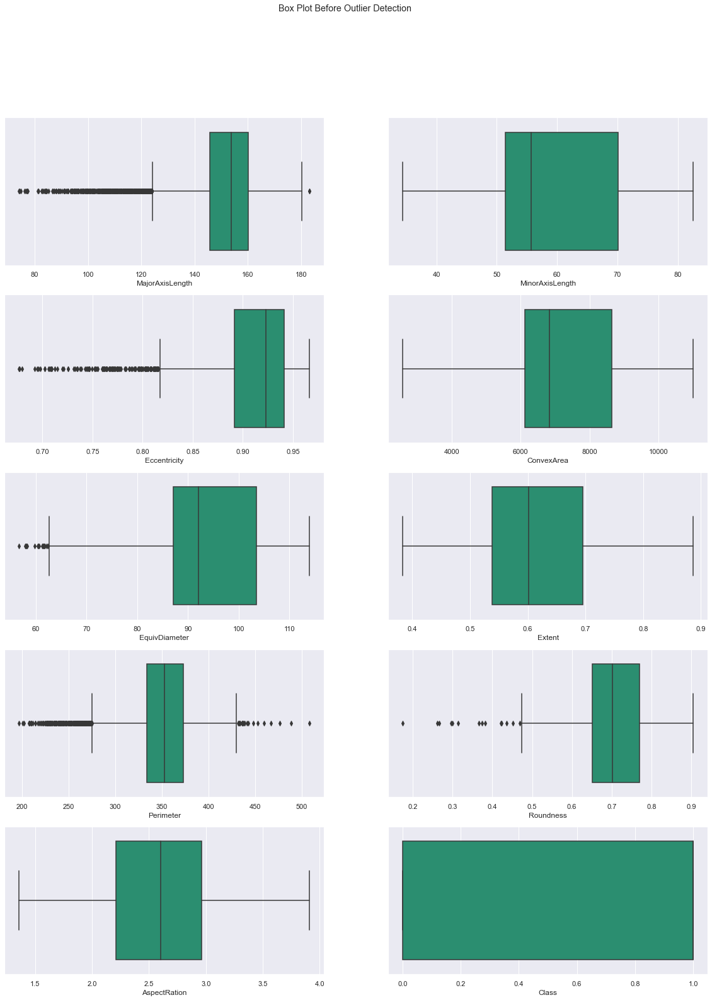

In [36]:
fig, axes = plt.subplots(5,2, figsize=(20,25))
fig.suptitle('Box Plot Before Outlier Detection')
k = 0
for i in range(0,5):
    for j in range(0,2):
        sns.boxplot(ax=axes[i,j], data=df, x=df.columns[k], palette='Dark2')
        k=k+1

***In this section of the code, outliers in the dataset are identified and removed to improve the overall performance of the classification model. The process consists of three main steps:***

1. ***Calculating the Interquartile Range (IQR): The IQR is calculated for each column in the dataset using the iqr_calculation() function. The IQR is the range between the first quartile (25th percentile) and the third quartile (75th percentile) of the data, providing a measure of the spread of the data.***

2. ***Removing the outliers: The remove_outliers() function is used to remove the rows with outlier values in any of the columns. Outliers are identified as values lower than Q1 - 1.5 * IQR or greater than Q3 + 1.5 * IQR. This function takes the main DataFrame, as well as the indices of the upper and lower outliers calculated by the iqr_calculation() function, and removes the corresponding rows from the DataFrame.***

3. ***Resetting the DataFrame index: After removing the outliers, the reset_dataframe() function is called to reset the index of the DataFrame. This step is necessary because the row indices of the removed outliers are left as gaps in the DataFrame. Resetting the index ensures that the DataFrame has a continuous index after outlier removal.***

4. ***Finally, a set of box plots is generated to visualize the distribution of the columns in the cleaned dataset. This helps to verify that the outliers have been successfully removed, and the data is now ready for further analysis and modeling.*** 

New Shape:  (17647, 10)
New Shape:  (17647, 10)
New Shape:  (17631, 10)
New Shape:  (17631, 10)
New Shape:  (17631, 10)
New Shape:  (17631, 10)
New Shape:  (17602, 10)
New Shape:  (17597, 10)
New Shape:  (17597, 10)


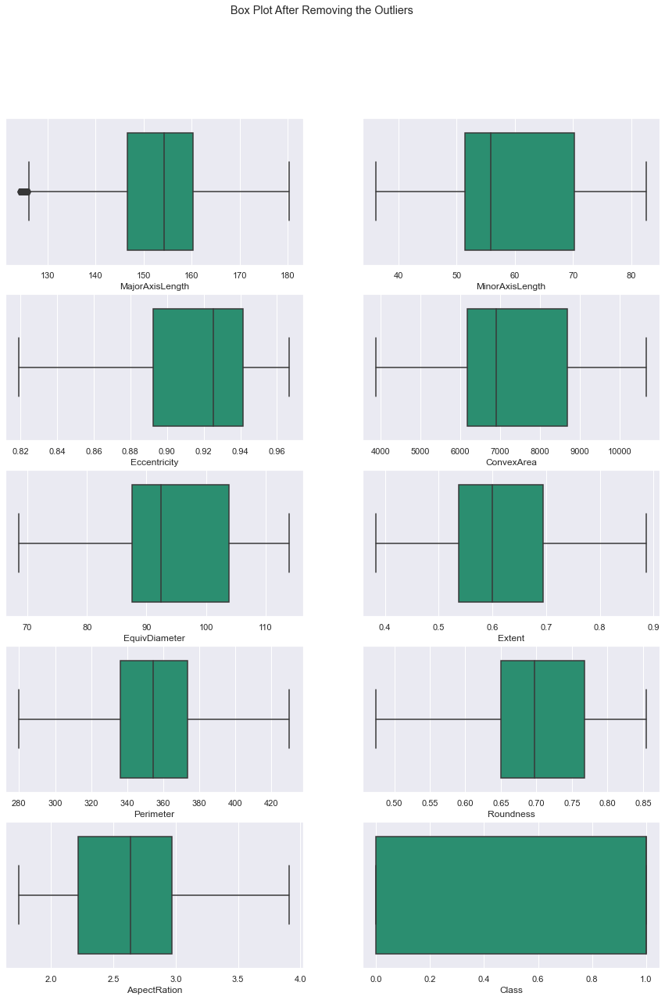

In [37]:


# Calculating the IQR
def iqr_calculation(main_df,col):
    Q1 = np.percentile(col,25,interpolation = 'midpoint')
    Q3 = np.percentile(col,75,interpolation = 'midpoint')
    IQR = Q3 - Q1
    upper = np.where(col>=(Q3+1.5*IQR))
    lower = np.where(col<=(Q1-1.5*IQR))
    return upper,lower
    
# Remove the outliers
def remove_outliers(main_df,upper,lower):
    main_df.drop(upper[0], inplace = True)
    main_df.drop(lower[0], inplace = True)
    print("New Shape: ", main_df.shape)
    return main_df

# Resetting the dataframe index
def reset_dataframe(main_df):
    main_df.reset_index(inplace=True)
    main_df.drop(columns=['index'],inplace=True)
    return main_df

main_df = df
for i in range(0,len(main_df.columns)-1):
#     print('For ',df.columns[i])
    upper, lower = iqr_calculation(main_df,df[df.columns[i]])
    main_df = remove_outliers(main_df,upper,lower)
    final_df = reset_dataframe(main_df)
    
fig, axes = plt.subplots(5,2, figsize=(15,20))
fig.suptitle('Box Plot After Removing the Outliers')
k = 0
for i in range(0,5):
    for j in range(0,2):
        col_name = final_df.columns[k]
        sns.boxplot(ax=axes[i,j], data=final_df,x=col_name,palette='Dark2')
        k=k+1

## Exploratory Data Analysis

**sns.pairplot** is a function in the seaborn library in Python that is used to plot pairwise relationships between multiple variables in a dataset. The resulting plot is a grid of scatterplots, with each variable plotted against every other variable.

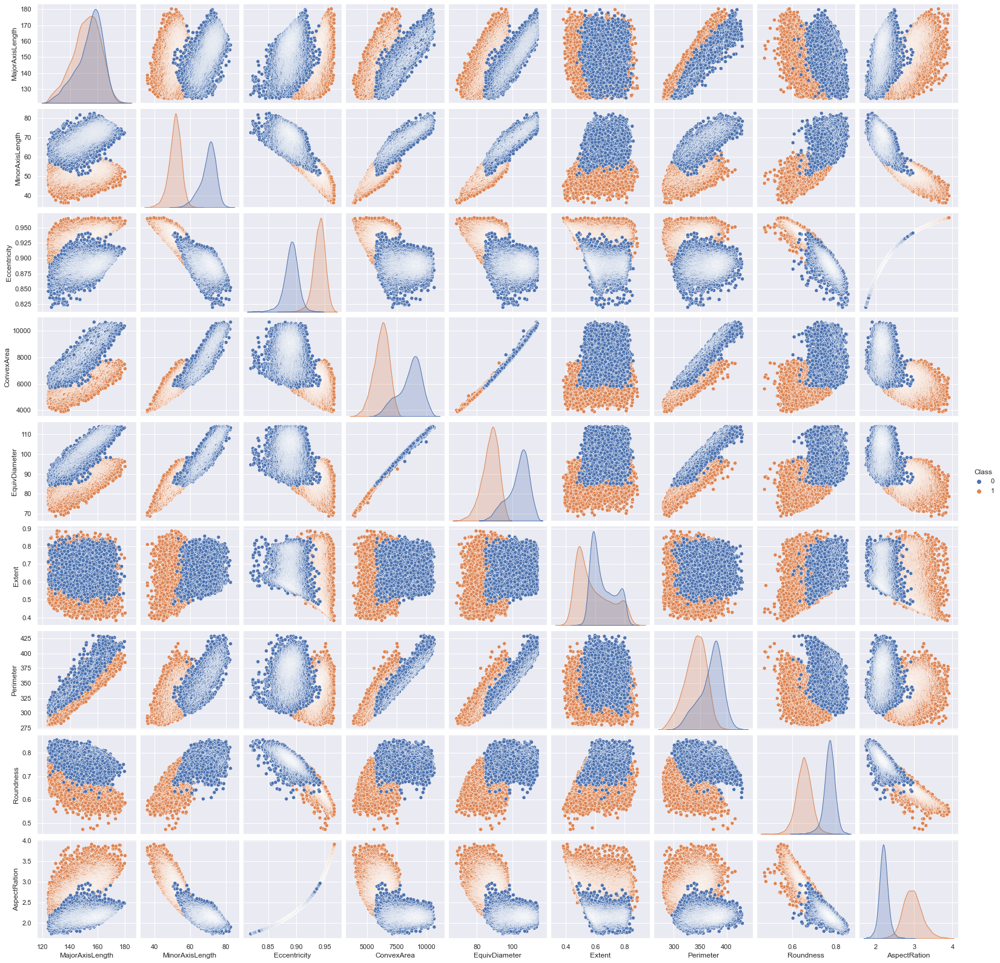

In [38]:
df = final_df
sns.pairplot(df, hue='Class')
plt.show()

***In this part of the code, a pie chart is created to visualize the distribution of the 'Class' column in the DataFrame. This plot helps to understand the balance between the different rice varieties present in the dataset. The 'Class' column represents the type of rice grain, with Jasmine rice labeled as 1 and Gonen rice labeled as 0.***

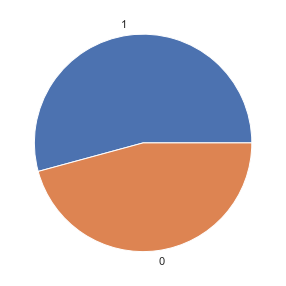

In [39]:
y =df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [40]:
X = df.drop(columns=['Class'])
X.head(10)

,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,129.576759,63.762307,0.870549,6476,90.086785,0.662234,314.656,0.809003,2.032184
1,136.303603,65.738475,0.876009,7115,94.042128,0.594437,338.782,0.760508,2.073422
2,125.555431,59.626250,0.880040,5945,85.831020,0.623491,307.304,0.769931,2.105707
3,127.013995,59.843292,0.882050,6092,86.643063,0.610352,309.264,0.774655,2.122443
4,129.098407,60.416315,0.883736,6204,87.999107,0.661375,308.106,0.805111,2.136814
5,125.244184,58.183519,0.885541,5786,84.613391,0.565922,303.047,0.769410,2.152572
6,125.867062,58.212050,0.886625,5759,84.756224,0.639973,301.902,0.777877,2.162217
7,131.291578,60.178119,0.888769,6203,87.861547,0.789453,313.372,0.775849,2.181716
8,128.288875,58.470846,0.890095,5954,85.793926,0.674090,316.756,0.724041,2.194066
9,135.249060,61.312148,0.891344,6528,89.789492,0.579747,328.799,0.736020,2.205910


***This part of the code provides a summary of the descriptive statistics for each numeric column in the DataFrame X. The describe() function generates a statistical summary of the dataset, including the count, mean, standard deviation, minimum, first quartile (25th percentile), median (50th percentile), third quartile (75th percentile), and maximum for each column.***

In [41]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
MajorAxisLength,17597.0,152.978496,9.926544,124.110890,146.610657,154.289429,160.280519,180.332508
MinorAxisLength,17597.0,59.961723,10.004501,36.177914,51.456124,55.917314,70.225361,82.550762
Eccentricity,17597.0,0.917226,0.027213,0.819338,0.892386,0.925461,0.941634,0.966774
ConvexArea,17597.0,7301.974086,1445.997988,3883.000000,6180.000000,6892.000000,8687.000000,10659.000000
EquivDiameter,17597.0,94.689501,9.407461,68.618072,87.534882,92.423829,103.810883,114.016559
Extent,17597.0,0.615732,0.104490,0.383239,0.536760,0.600259,0.694617,0.886137
Perimeter,17597.0,353.964315,25.733769,280.060000,335.976000,354.276000,373.589000,429.919000
Roundness,17597.0,0.706197,0.065566,0.474142,0.650238,0.697445,0.768167,0.854461
AspectRation,17597.0,2.615482,0.424586,1.744254,2.215959,2.639618,2.970556,3.911845


**Standardize the Data**

In [42]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,-2.357558,0.379898,-1.715263,-0.571230,-0.489276,0.445051,-1.527543,1.568010,-1.373844
1,-1.679876,0.577432,-1.514624,-0.129308,-0.068817,-0.203803,-0.589993,0.828370,-1.276717
2,-2.762678,-0.033533,-1.366505,-0.938461,-0.941671,0.074262,-1.813245,0.972087,-1.200675
3,-2.615738,-0.011838,-1.292623,-0.836798,-0.855349,-0.051490,-1.737079,1.044144,-1.161257
4,-2.405748,0.045440,-1.230695,-0.759341,-0.711200,0.436827,-1.782079,1.508662,-1.127410
5,-2.794034,-0.177745,-1.164340,-1.048423,-1.071107,-0.476712,-1.978675,0.964143,-1.090296
6,-2.731283,-0.174893,-1.124504,-1.067095,-1.055923,0.231999,-2.023170,1.093280,-1.067578
7,-2.184802,0.021631,-1.045718,-0.760032,-0.725823,1.662617,-1.577440,1.062344,-1.021651
8,-2.487303,-0.149025,-0.997000,-0.932237,-0.945614,0.558527,-1.445936,0.272164,-0.992564
9,-1.786114,0.134986,-0.951108,-0.535268,-0.520879,-0.344395,-0.977938,0.454875,-0.964668


**Observations and variables**

In [43]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

Box and whisker plots, also known as box plots, are a type of graphical representation used to display the distribution and summary statistics of a dataset. They provide a visual representation of the central tendency, spread, and skewness of each numeric feature in the dataset, making them particularly useful for identifying potential outliers and understanding the overall characteristics of the data.

In the context of your dataset, box and whisker plots can help you explore the distribution of each attribute related to the rice grains, such as MajorAxisLength, MinorAxisLength, Eccentricity, ConvexArea, EquivDiameter, Extent, Perimeter, Roundness, and AspectRation

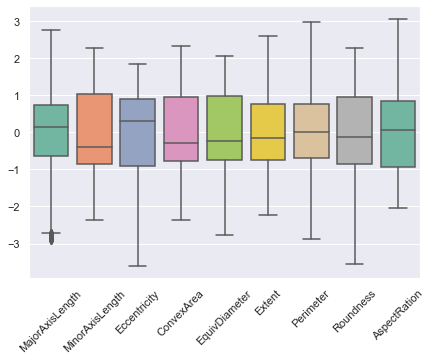

In [44]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

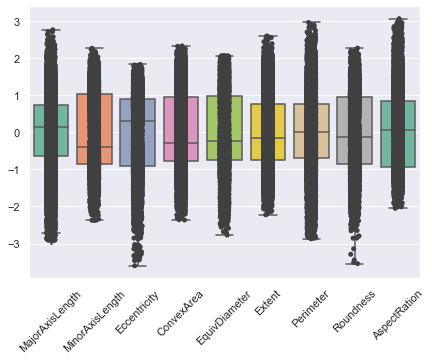

In [45]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:

ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

A correlation matrix is a table that shows the correlation coefficients between pairs of variables in a dataset. It is used to measure and visualize the strength and direction of the linear relationships between features. The correlation coefficient ranges from -1 to 1, with -1 indicating a strong negative correlation, 1 indicating a strong positive correlation, and 0 indicating no correlation.

In the context of this dataset, a correlation matrix can help us understand how the various attributes of the rice grains, such as MajorAxisLength, MinorAxisLength, Eccentricity, ConvexArea, EquivDiameter, Extent, Perimeter, Roundness, and AspectRation, are related to one another. By examining the correlation matrix, you can identify the features that are strongly correlated with each other, which can have implications for feature selection, multicollinearity, and model interpretability.

In [46]:
dpi = 600
plt.figure(figsize=(17, 16), dpi=dpi)
ax = sns.heatmap(X.corr(), cmap='coolwarm_r', linewidths=0.5, annot=True, cbar=False, square=True, vmin=-1, vmax=1)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

## **Applying PCA**

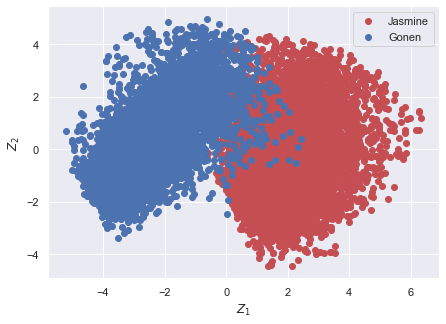

In [47]:
# Apply PCA to the dataset
pca = PCA()
Z = pca.fit_transform(X)

# Find the indices of each class in the target variable y
idx_jasmine = np.where(y == 1)
idx_gonen = np.where(y == 0)

# Plot the PCA-transformed data
plt.figure()
plt.scatter(Z[idx_jasmine, 0], Z[idx_jasmine, 1], c='r', label='Jasmine')
plt.scatter(Z[idx_gonen, 0], Z[idx_gonen, 1], c='b', label='Gonen')

plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

# Display the plot
plt.show()

**Eigenvectors**

Eigenvectors are fundamental concepts in linear algebra, representing the directions along which linear transformations cause only scaling and not rotation. In the context of a square matrix, an eigenvector is a non-zero vector that, when multiplied by the matrix, results in a scaled version of itself, where the scaling factor is the corresponding eigenvalue. Eigenvectors are widely used in various fields, including data analysis, engineering, and physics, as they help reveal the underlying structure of data or systems. In dimensionality reduction techniques like Principal Component Analysis (PCA), eigenvectors are the basis for the newly formed, uncorrelated features, capturing the directions of maximum variance in the data. The eigenvectors, along with their associated eigenvalues, provide insight into the significance and contribution of each principal component to the overall variability in the data.

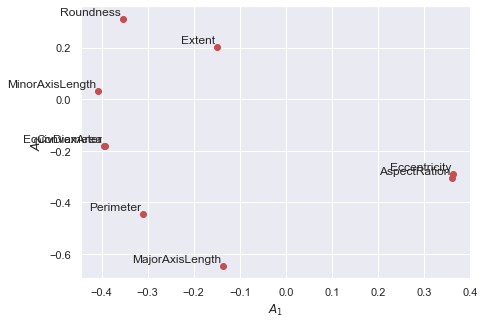

In [48]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

c:\users\sazgar\appdata\local\programs\python\python39\lib\site-packages\matplotlib\collections.py:1003: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


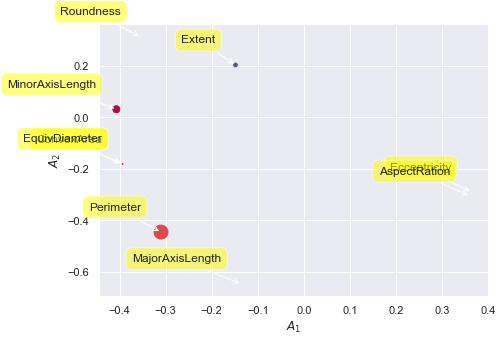

In [49]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

## Scree plot

A scree plot is a graphical representation of the eigenvalues associated with each principal component in a Principal Component Analysis (PCA). It helps in determining the optimal number of principal components to retain while preserving the majority of the original data's variance. The scree plot displays the eigenvalues in descending order, with each eigenvalue represented as a point or bar on the plot. By visually examining the scree plot, researchers often look for an "elbow" or a point where the decline in eigenvalues levels off, which suggests that subsequent components contribute relatively less to the overall variance. This elbow point is used as a criterion to select the number of principal components to include in further analysis, ensuring a balance between dimensionality reduction and information retention.

Text(0, 0.5, 'Explained variance')

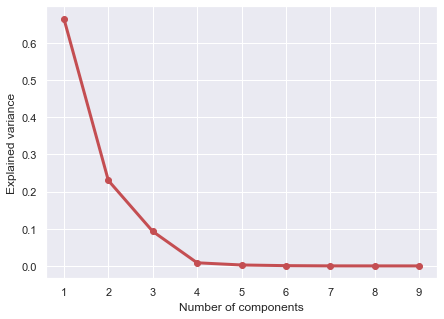

In [50]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

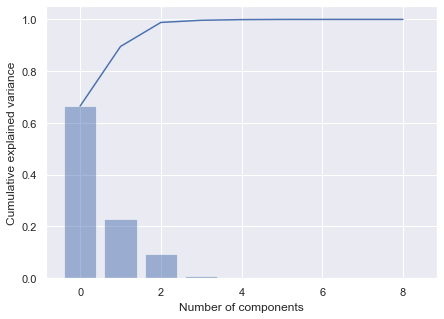

In [51]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

## **Biplot**

A biplot is a data visualization technique that combines the features of a scatter plot and a loading plot, providing a comprehensive view of the relationships among data points, variables, and principal components. Typically used with Principal Component Analysis (PCA) or other dimensionality reduction methods, a biplot displays the original data points projected onto the first two or three principal components, as well as the loadings of the original variables on these components. Biplots help in identifying patterns, clusters, and outliers in the data, while also revealing correlations and contributions of the original variables to the principal components. The proximity between data points in the biplot reflects their similarity, while the angles between variable vectors indicate the strength of correlation between variables. By summarizing the multivariate relationships in a two-dimensional or three-dimensional space, biplots enable a more intuitive interpretation of complex datasets and can inform decisions on feature selection, data preprocessing, and model building.

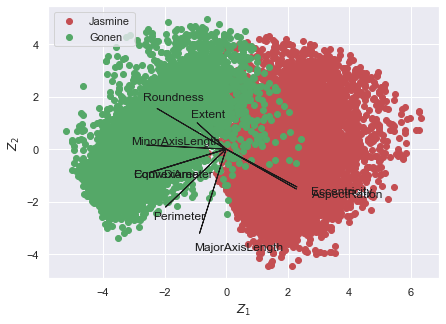

In [52]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_jasmine,0], Z[idx_jasmine,1], c='r', label='Jasmine')
plt.scatter(Z[idx_gonen,0], Z[idx_gonen,1], c='g', label='Gonen')
plt.legend(loc='upper left')

## **Using PCA Library**

In [53]:
!pip3 install pca

In [54]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

c:\users\sazgar\appdata\local\programs\python\python39\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.8) or chardet (5.0.0)/charset_normalizer (2.0.11) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [9] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [9] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [55]:
out['PC']

,PC1,PC2,PC3
0,-0.682421,3.907858,-0.461118
1,-1.019615,2.451507,-0.895231
2,0.407389,4.017810,-0.709537
3,0.315209,3.818873,-0.808593
4,-0.011963,3.879952,-0.353410
...,...,...,...
17592,2.321944,0.064227,-0.812788
17593,0.035929,-2.467780,0.829905
17594,1.576677,-0.430204,-0.194465
17595,2.259760,-0.513108,-0.773116


**Scatter plot**

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.


(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot:title={'center':'3 Principal Components explain [99.66%] of the variance'}, xlabel='PC1 (66.5% expl.var)', ylabel='PC2 (22.9% expl.var)'>)

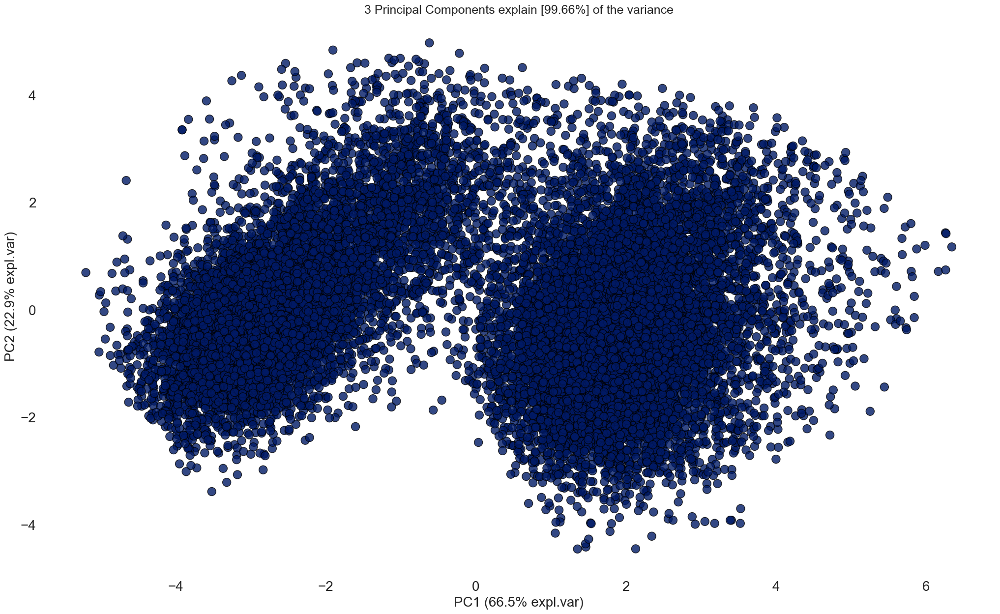

In [56]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [57]:
A = out['loadings'].T

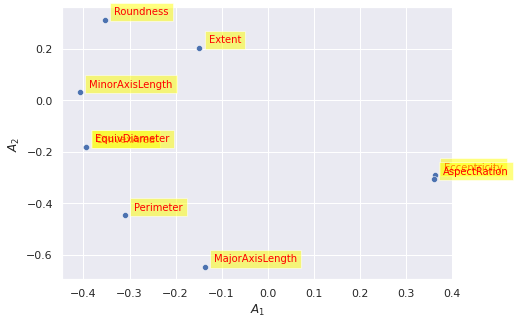

In [58]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

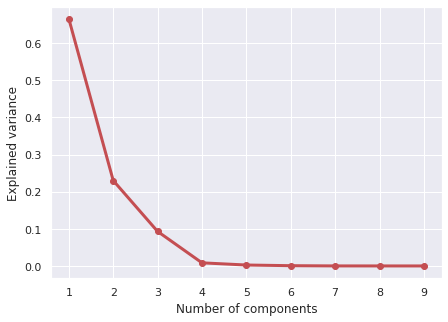

In [59]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

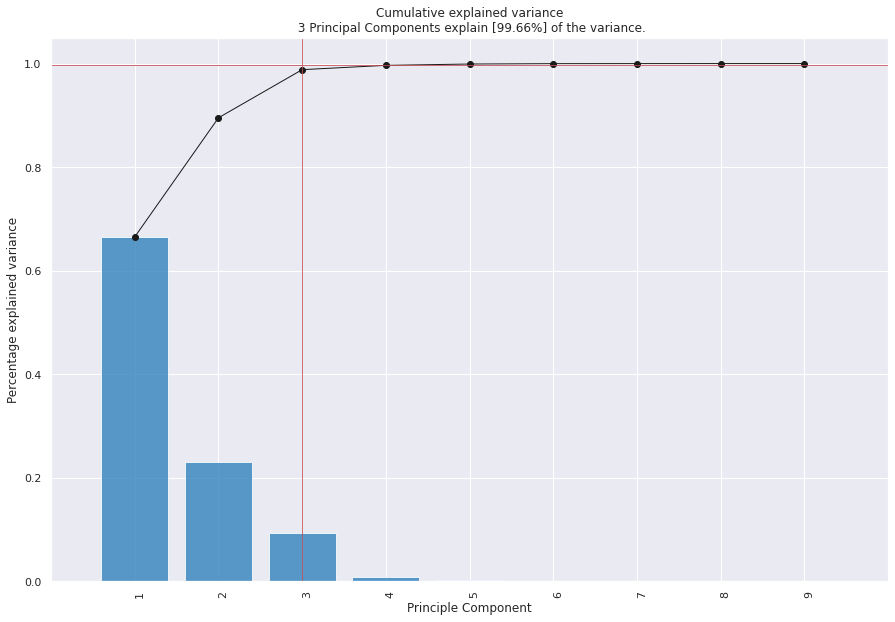

<Figure size 504x360 with 0 Axes>

In [60]:
model.plot();

**Biplot**

A biplot is a graphical representation of multivariate data that displays both observations and variables simultaneously in a single plot. Each observation is represented as a point in a two-dimensional plot, while the variables are represented as arrows or vectors that point in the direction of the greatest variation in the data. The length of the vector indicates the magnitude of the variable, while the angle between two vectors reflects their correlation.

[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.


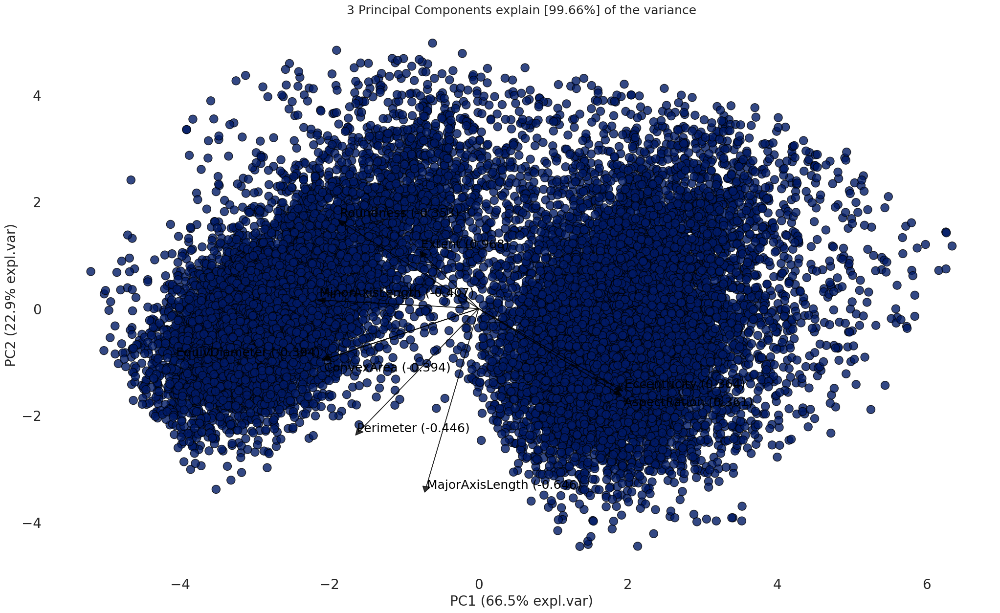

(<Figure size 2500x1500 with 1 Axes>,
 <AxesSubplot:title={'center':'3 Principal Components explain [99.66%] of the variance'}, xlabel='PC1 (66.5% expl.var)', ylabel='PC2 (22.9% expl.var)'>)

In [61]:
model.biplot(label=False, legend=False)

# **Multiclass Classification with PyCaret**

Multiclass classification is a supervised machine learning technique where the goal is to classify instances into one of three or more classes. (Classifying instances into one of two classes is called Binary Classification).

**Using PyCaret**

PyCaret uses interactive plotting ability. In order to render interactive plots in Google Colab, run the below line of code in your colab notebook. The enable_colab() function in PyCaret is used to install and configure all the necessary dependencies to use PyCaret in Google Colab.

In [62]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


**Data Splitting**

In order to demonstrate the predict_model() function on unseen data, a sample of 21 observations has been withheld from the original dataset to be used for predictions. This should not be confused with a train/test split as this particular split is performed to simulate a real life scenario. Another way to think about this is that these 21 records were not available at the time when the machine learning experiment was performed.

In [63]:
data = df.sample(frac=0.9, random_state=786)
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (15837, 10)
Unseen Data For Predictions: (1760, 10)


**Setting up the Environment in PyCaret**

The **setup()** function initializes the environment in pycaret and creates the transformation pipeline to prepare the data for modeling and deployment. setup() must be called before executing any other function in pycaret. It takes two mandatory parameters: a pandas dataframe and the name of the target column. All other parameters are optional and are used to customize the pre-processing pipeline.

When setup() is executed, PyCaret's inference algorithm will automatically infer the data types for all features based on certain properties. The data type should be inferred correctly but this is not always the case. To account for this, PyCaret displays a table containing the features and their inferred data types after setup() is executed. If all of the data types are correctly identified enter can be pressed to continue or quit can be typed to end the expriment. Ensuring that the data types are correct is of fundamental importance in PyCaret as it automatically performs a few pre-processing tasks which are imperative to any machine learning experiment. These tasks are performed differently for each data type which means it is very important for them to be correctly configured.

In [64]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(15837, 10)"
5,Missing Values,0
6,Numeric Features,9
7,Categorical Features,0
8,Ordinal Features,0
9,High Cardinality Features,0


Once the setup has been succesfully executed it prints the information grid which contains several important pieces of information. Most of the information is related to the pre-processing pipeline which is constructed when setup() is executed. The majority of these features are out of scope for the purposes of this tutorial however a few important things to note at this stage include:

* **session_id** : A pseduo-random number distributed as a seed in all functions for later reproducibility. If no session_id is passed, a random number is automatically generated that is distributed to all functions. In this experiment, the session_id is set as 123 for later reproducibility.

* **Target Type** : Binary or Multiclass. The Target type is automatically detected and shown. There is no difference in how the experiment is performed for Binary or Multiclass problems. All functionalities are identical.

* **Label Encoded** : When the Target variable is of type string (i.e. 'Yes' or 'No') instead of 1 or 0, it automatically encodes the label into 1 and 0 and displays the mapping (0 : No, 1 : Yes) for reference. 

* **Original Data** : Displays the original shape of the dataset. In this experiment (189, 8) means 189 samples and 8 features including the class column.

* **Missing Values** : When there are missing values in the original data this will show as True. For this experiment there are no missing values in the dataset.

* **Numeric Features** : The number of features inferred as numeric. In this dataset, 7 out of 8 features are inferred as numeric.

* **Categorical Features** : The number of features inferred as categorical. In this dataset, there are no categorical features.

* **Transformed Train Set** : Displays the shape of the transformed training set. Notice that the original shape of (189, 8) is transformed into (132, 7) for the transformed train set.

* **Transformed Test Set** : Displays the shape of the transformed test/hold-out set. There are 57 samples in test/hold-out set. This split is based on the default value of 70/30 that can be changed using the train_size parameter in setup.

Notice how a few tasks that are imperative to perform modeling are automatically handled such as missing value imputation, categorical encoding etc. Most of the parameters in setup() are optional and used for customizing the pre-processing pipeline. 

**Comparing all Machine Learning Models**

In [65]:
 #show the best model and their statistics
 best_model = compare_models() 

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9892,0.9992,0.9920,0.9880,0.9900,0.9782,0.9782,0.8550
gbc,Gradient Boosting Classifier,0.9892,0.9990,0.9921,0.9879,0.9900,0.9782,0.9782,0.6730
et,Extra Trees Classifier,0.9892,0.9983,0.9918,0.9882,0.9900,0.9782,0.9782,0.1960
rf,Random Forest Classifier,0.9887,0.9984,0.9915,0.9877,0.9896,0.9773,0.9773,0.2620
ada,Ada Boost Classifier,0.9887,0.9986,0.9923,0.9869,0.9896,0.9773,0.9773,0.1820
knn,K Neighbors Classifier,0.9885,0.9956,0.9910,0.9879,0.9894,0.9769,0.9770,0.0290
lightgbm,Light Gradient Boosting Machine,0.9885,0.9989,0.9916,0.9870,0.9893,0.9768,0.9768,0.0920
nb,Naive Bayes,0.9883,0.9988,0.9931,0.9853,0.9892,0.9764,0.9764,0.0090
ridge,Ridge Classifier,0.9862,0.0000,0.9977,0.9773,0.9874,0.9722,0.9725,0.0080
qda,Quadratic Discriminant Analysis,0.9861,0.9980,0.9850,0.9893,0.9871,0.9721,0.9721,0.0090


Based on the table provided, the top 3 models with the best overall performance are:

1. ***Logistic Regression***
2. ***Decision Tree Classifier***
3. ***K-Narest Neighbors***

Let's compare these models to the other models in the table in terms of various factors:

- Accuracy: Logistic Regression, Decision Tree Classifier, and K-NN have higher accuracy scores (0.9892, 0.9841, and 0.9885, respectively) compared to other models, like SVM-Linear Kernel (0.9730) and Dummy Classifier (0.5397). This indicates that these three models are better at correctly classifying instances compared to other models.

- AUC: AUC (Area Under the Curve) is a popular performance metric for evaluating binary classification models. Logistic Regression has an AUC of 0.9992, K-NN has 0.9956, and Decision Tree Classifier has 0.9840. These scores are higher than many other models in the table, suggesting that these three models perform better in terms of distinguishing between the positive and negative classes.

- Recall, Precision, and F1-score: These three models exhibit high recall, precision, and F1-scores, which indicate that they can successfully identify true positive instances and minimize false positive and false negative cases. For instance, the F1-score for Logistic Regression, K-NN, and Decision Tree Classifier are 0.9900, 0.9894, and 0.9853, respectively, which are higher than most of the other models.

- Time complexity: K-NN (0.0440 seconds) and Decision Tree Classifier (0.0300 seconds) have lower training times compared to other models, such as Logistic Regression (1.4490 seconds) and Gradient Boosting Classifier (0.8470 seconds). This suggests that these two models are computationally more efficient.

In summary, Logistic Regression, Decision Tree Classifier, and K-NN have superior performance in terms of accuracy, AUC, recall, precision, and F1-score, and they demonstrate competitive training times compared to other models. These factors contribute to their selection as the best models for the given classification task. However, it's essential to keep in mind that the choice of the best model depends on the specific problem, the dataset characteristics, and the evaluation criteria.

In [66]:
best_model

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Create a Model**

create_model is the most granular function in PyCaret and is often the foundation behind most of the PyCaret functionalities. As the name suggests this function trains and evaluates a model using cross validation that can be set with fold parameter. The output prints a score grid that shows Accuracy, Recall, Precision, F1, Kappa and MCC by fold.

For the remaining part of this tutorial, we will work with the below models as our candidate models. The selections are for illustration purposes only and do not necessarily mean they are the top performing or ideal for this type of data.

* Decision Tree Classifier ('dt')
* K Neighbors Classifier ('knn')
* Logistic Regression ('lr')

There are many classifiers available in the model library of PyCaret. Please view the create_model() docstring for the list of all available models.

## **Create Decision Tree Classifier**

A Decision Tree Classifier is a supervised machine learning algorithm used for classification tasks. It works by recursively splitting the data into subsets based on the values of input features, ultimately leading to a tree-like structure. The goal is to create a tree that can accurately classify new instances by following the branches from the root node to a leaf node, which represents the predicted class label.

The main components of a decision tree are:

- Nodes: They represent the points where the decision to split the data is made based on a certain condition or attribute.
    - Root Node: The topmost node in the tree from which the data splitting process starts.- 
    -Internal Nodes: Nodes that test a condition on a specific feature and further split the data.
    -Leaf Nodes: Terminal nodes that represent the final class labels or predictions.
- Branches: They represent the outcome of the test at a node and connect nodes in the tree structure.

The process of building a decision tree involves selecting the best attribute to split the data at each node. This decision is usually based on a criterion like Gini impurity or information gain, which measures the impurity or disorder in the data subsets resulting from the split. The tree is built in a top-down manner, either until a predefined depth is reached or further splitting does not result in a significant improvement in impurity.

In [67]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9838,0.9834,0.9883,0.9817,0.9850,0.9673,0.9673
1,0.9829,0.9831,0.9799,0.9882,0.9840,0.9655,0.9656
2,0.9829,0.9828,0.9833,0.9849,0.9841,0.9655,0.9655
3,0.9892,0.9887,0.9950,0.9851,0.9900,0.9782,0.9783
4,0.9856,0.9856,0.9850,0.9883,0.9866,0.9710,0.9710
5,0.9856,0.9850,0.9916,0.9818,0.9867,0.9709,0.9710
6,0.9865,0.9863,0.9883,0.9866,0.9875,0.9727,0.9727
7,0.9829,0.9821,0.9916,0.9769,0.9842,0.9654,0.9656
8,0.9774,0.9779,0.9716,0.9864,0.9789,0.9546,0.9548
9,0.9847,0.9849,0.9816,0.9899,0.9857,0.9691,0.9692


**Tune a Model:** How to automatically tune the hyper-parameters of a multiclass model. When a model is created using the create_model() function it uses the default hyperparameters. In order to tune hyperparameters, the tune_model() function is used. The tune_model() function is a random grid search of hyperparameters over a pre-defined search space. By default, it is set to optimize Accuracy but this can be changed using optimize parameter. This function automatically tunes the hyperparameters of a model on a pre-defined search space and scores it using stratified cross validation. The output prints a score grid that shows Accuracy, AUC, Recall, Precision, F1 and Kappa by fold.

**Tune Decision Tree Model**

In [68]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9856,0.9949,0.9916,0.9818,0.9867,0.9709,0.9710
1,0.9874,0.9941,0.9883,0.9883,0.9883,0.9746,0.9746
2,0.9820,0.9871,0.9800,0.9866,0.9832,0.9637,0.9637
3,0.9901,0.9963,0.9950,0.9868,0.9909,0.9800,0.9801
4,0.9910,0.9935,0.9967,0.9868,0.9917,0.9818,0.9819
5,0.9910,0.9903,0.9983,0.9851,0.9917,0.9818,0.9819
6,0.9919,0.9933,0.9933,0.9917,0.9925,0.9836,0.9837
7,0.9838,0.9895,0.9916,0.9785,0.9850,0.9673,0.9674
8,0.9856,0.9951,0.9833,0.9899,0.9866,0.9710,0.9710
9,0.9919,0.9952,0.9916,0.9933,0.9925,0.9837,0.9837


**Comparing tuned and non-tuned Decision Tree models**

In [69]:
print("Base DT Model: ",dt)
print("Tuned DT Model: ",tuned_dt)

Base DT Model:  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
Tuned DT Model:  DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')


**Evaluate Decision Tree Model**

In [70]:
#Update statmodels
#!pip3 install statsmodels --upgrade

How to analyze model performance using various plots

In [71]:
evaluate_model(tuned_dt)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K Neighbors Model**

The K-Nearest Neighbors (KNN) model is a non-parametric, instance-based supervised machine learning algorithm used for both classification and regression tasks. It is based on the principle that data points that are close to each other in the feature space are likely to have similar class labels or target values.

The KNN algorithm works as follows:

- Given a new data point for which the class label or target value needs to be predicted, the algorithm calculates the distance between the new data point and all other data points in the training dataset. The distance can be calculated using various metrics, such as Euclidean, Manhattan, or Minkowski distance.
- The algorithm then selects the 'K' closest data points (neighbors) to the new data point, based on the calculated distances.
- For classification tasks, the algorithm assigns the class label that is most frequent among the 'K' neighbors as the prediction for the new data point. For regression tasks, the predicted target value is the average of the target values of the 'K' neighbors.

In [72]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9874,0.9947,0.9933,0.9834,0.9884,0.9746,0.9746
1,0.9883,0.9924,0.9883,0.9899,0.9891,0.9764,0.9764
2,0.9856,0.9943,0.9850,0.9883,0.9866,0.9710,0.9710
3,0.9901,0.9968,0.9950,0.9868,0.9909,0.9800,0.9801
4,0.9919,0.9977,0.9983,0.9868,0.9925,0.9836,0.9837
5,0.9883,0.9947,0.9950,0.9835,0.9892,0.9764,0.9764
6,0.9928,0.9970,0.9950,0.9917,0.9933,0.9855,0.9855
7,0.9856,0.9956,0.9916,0.9818,0.9867,0.9709,0.9710
8,0.9856,0.9951,0.9799,0.9932,0.9865,0.9710,0.9711
9,0.9901,0.9978,0.9883,0.9933,0.9908,0.9800,0.9800


**Tune K Neighbors Model**

In [73]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9865,0.9981,0.9933,0.9818,0.9875,0.9728,0.9728
1,0.9865,0.9982,0.9883,0.9866,0.9875,0.9728,0.9728
2,0.9865,0.9985,0.9866,0.9883,0.9875,0.9728,0.9728
3,0.9910,0.9986,0.9967,0.9868,0.9917,0.9818,0.9819
4,0.9919,0.9995,0.9967,0.9884,0.9925,0.9837,0.9837
5,0.9919,0.9982,1.0000,0.9852,0.9925,0.9836,0.9838
6,0.9928,0.9975,0.9950,0.9917,0.9933,0.9855,0.9855
7,0.9847,0.9962,0.9916,0.9802,0.9859,0.9691,0.9692
8,0.9874,0.9983,0.9849,0.9916,0.9883,0.9746,0.9746
9,0.9919,0.9994,0.9933,0.9917,0.9925,0.9836,0.9837


**Comparing tuned and non-tuned K-NN models**

In [74]:
print("Base KNN Model: ",knn)
print("\nTuned KNN Model: ",tuned_knn)

Base KNN Model:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

Tuned KNN Model:  KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=34, p=2,
                     weights='uniform')


**Evaluate K Neighbors Model**

In [76]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Logistic Regression Model**

Logistic Regression is a supervised machine learning algorithm used for binary classification tasks. It is a statistical method that models the probability of a binary outcome (0 or 1) based on one or more input features. Logistic Regression can be extended to handle multi-class classification problems using techniques like One-vs-Rest or the Softmax function.

The main idea behind Logistic Regression is to model the probability of an instance belonging to a specific class using the logistic function (also known as the sigmoid function), which takes any real-valued input and maps it to a value between 0 and 1. This probability is then used to make the final binary classification.

Logistic Regression works as follows:

1. Each input feature is multiplied by a corresponding weight or coefficient, and a bias term is added to obtain the linear combination of features.
2. The logistic function is applied to the linear combination, yielding the probability of the instance belonging to the positive class (class 1).
3. A decision threshold (usually 0.5) is applied to the calculated probability. If the probability is greater than or equal to the threshold, the instance is classified as the positive class (1); otherwise, it is classified as the negative class (0).

The coefficients and bias term in the Logistic Regression model are learned by minimizing a loss function called the Cross-Entropy loss, which measures the difference between the predicted probabilities and the true class labels.

In [77]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9901,0.9993,0.9950,0.9867,0.9908,0.9800,0.9801
1,0.9865,0.9994,0.9866,0.9883,0.9874,0.9728,0.9728
2,0.9847,0.9993,0.9833,0.9883,0.9858,0.9692,0.9692
3,0.9928,0.9992,0.9967,0.9900,0.9933,0.9855,0.9855
4,0.9937,0.9998,0.9967,0.9917,0.9942,0.9873,0.9873
5,0.9874,0.9993,0.9983,0.9787,0.9884,0.9745,0.9748
6,0.9928,0.9993,0.9950,0.9917,0.9933,0.9855,0.9855
7,0.9856,0.9979,0.9916,0.9818,0.9867,0.9709,0.9710
8,0.9865,0.9992,0.9833,0.9916,0.9874,0.9728,0.9728
9,0.9919,0.9994,0.9933,0.9917,0.9925,0.9836,0.9837


**Tune Logistic Regression Model**

In [78]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9883,0.9991,0.9916,0.9867,0.9892,0.9764,0.9764
1,0.9874,0.9992,0.9883,0.9883,0.9883,0.9746,0.9746
2,0.9847,0.9992,0.9850,0.9866,0.9858,0.9691,0.9691
3,0.9919,0.9990,0.9950,0.9900,0.9925,0.9837,0.9837
4,0.9937,0.9998,0.9967,0.9917,0.9942,0.9873,0.9873
5,0.9892,0.9992,0.9983,0.9819,0.9900,0.9782,0.9783
6,0.9928,0.9994,0.9950,0.9917,0.9933,0.9855,0.9855
7,0.9856,0.9978,0.9916,0.9818,0.9867,0.9709,0.9710
8,0.9865,0.9992,0.9833,0.9916,0.9874,0.9728,0.9728
9,0.9946,0.9993,0.9967,0.9933,0.9950,0.9891,0.9891


**Comparing tuned and non-tuned LR model**

In [79]:
print("Base LR Model: ",lr)
print("\nTuned LR Model: ",tuned_lr)

Base LR Model:  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Tuned LR Model:  LogisticRegression(C=0.056, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


**Evaluate Logistic Regression Model**

In [80]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Random Forest Model**

Random Forest is an ensemble learning method used for both classification and regression tasks. It is based on the idea of creating multiple decision trees and combining their predictions to achieve better generalization and robustness. By averaging the predictions from multiple trees, Random Forest can often yield more accurate and stable predictions than a single decision tree.

The Random Forest model works as follows:

- A specific number of decision trees are created (specified by a hyperparameter) using a process called bootstrapping. In bootstrapping, a random sample of instances is drawn with replacement from the original dataset to form a new dataset of the same size. This new dataset is used to train each decision tree.
- At each node of a decision tree, a random subset of features is selected as candidates for splitting. This introduces additional randomness and reduces the correlation between individual trees, leading to a more diverse ensemble.
- Each decision tree is grown to its maximum depth, usually without pruning. This allows each tree to learn complex patterns and interactions between features, albeit with a risk of overfitting.
- To make a prediction for a new instance, the instance is passed through all the decision trees in the ensemble. For classification tasks, the final prediction is obtained by a majority vote among the class predictions from individual trees. For regression tasks, the final prediction is the average of the predicted target values from individual trees.

In [81]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9883,0.9981,0.9916,0.9867,0.9892,0.9764,0.9764
1,0.9865,0.9981,0.9866,0.9883,0.9874,0.9728,0.9728
2,0.9865,0.9992,0.9883,0.9867,0.9875,0.9728,0.9728
3,0.9910,0.9985,0.9950,0.9884,0.9917,0.9818,0.9819
4,0.9910,0.9997,0.9983,0.9852,0.9917,0.9818,0.9819
5,0.9874,0.9983,0.9933,0.9834,0.9884,0.9745,0.9746
6,0.9928,0.9974,0.9933,0.9933,0.9933,0.9855,0.9855
7,0.9865,0.9972,0.9933,0.9818,0.9875,0.9727,0.9728
8,0.9856,0.9993,0.9816,0.9916,0.9866,0.9710,0.9710
9,0.9919,0.9985,0.9933,0.9917,0.9925,0.9836,0.9837


**Tune Random Forest Model**

In [82]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9892,0.9984,0.9950,0.9851,0.9900,0.9782,0.9783
1,0.9856,0.9990,0.9866,0.9866,0.9866,0.9710,0.9710
2,0.9847,0.9990,0.9833,0.9883,0.9858,0.9692,0.9692
3,0.9901,0.9979,0.9950,0.9868,0.9909,0.9800,0.9801
4,0.9928,0.9994,0.9967,0.9900,0.9933,0.9855,0.9855
5,0.9910,0.9990,0.9983,0.9851,0.9917,0.9818,0.9819
6,0.9937,0.9989,0.9950,0.9933,0.9942,0.9873,0.9873
7,0.9847,0.9967,0.9933,0.9786,0.9859,0.9691,0.9692
8,0.9874,0.9992,0.9849,0.9916,0.9883,0.9746,0.9746
9,0.9901,0.9988,0.9916,0.9900,0.9908,0.9800,0.9800


**Comparing tuned and non-tuned RF model**

In [83]:
print("Base RF Model: ", rf)
print("\nTuned RF Model: ",tuned_rf)

Base RF Model:  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

Tuned RF Model:  RandomForestClassifier(bootstrap=False, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='gini',
                       max_depth=4, max_features='sqrt', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0005,
                       min_impurity_split=None, min_samples_leaf=3,
                       min_samples_split=5, min_weight_fraction_leaf=0.0,


**Evaluate Random Forest Model**

In [84]:
evaluate_model(tuned_rf)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Tune the Best Model**

In [85]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9883,0.9991,0.9916,0.9867,0.9892,0.9764,0.9764
1,0.9874,0.9992,0.9883,0.9883,0.9883,0.9746,0.9746
2,0.9847,0.9992,0.9850,0.9866,0.9858,0.9691,0.9691
3,0.9919,0.9990,0.9950,0.9900,0.9925,0.9837,0.9837
4,0.9937,0.9998,0.9967,0.9917,0.9942,0.9873,0.9873
5,0.9892,0.9992,0.9983,0.9819,0.9900,0.9782,0.9783
6,0.9928,0.9994,0.9950,0.9917,0.9933,0.9855,0.9855
7,0.9856,0.9978,0.9916,0.9818,0.9867,0.9709,0.9710
8,0.9865,0.9992,0.9833,0.9916,0.9874,0.9728,0.9728
9,0.9946,0.9993,0.9967,0.9933,0.9950,0.9891,0.9891


In [86]:
tuned_best_model

LogisticRegression(C=0.056, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [87]:
evaluate_model(tuned_best_model)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Classification + PCA**

In [88]:
clf_pca = setup(data=df, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,None
4,Original Data,"(17597, 10)"
5,Missing Values,0
6,Numeric Features,9
7,Categorical Features,0
8,Ordinal Features,0
9,High Cardinality Features,0


In [89]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lr,Logistic Regression,0.9893,0.9988,0.9927,0.9877,0.9902,0.9784,0.9784,0.0120
knn,K Neighbors Classifier,0.9885,0.9946,0.9915,0.9874,0.9894,0.9767,0.9768,0.0280
ridge,Ridge Classifier,0.9885,0.0000,0.9940,0.9849,0.9895,0.9767,0.9768,0.0080
lda,Linear Discriminant Analysis,0.9885,0.9988,0.9940,0.9849,0.9895,0.9767,0.9768,0.0090
svm,SVM - Linear Kernel,0.9881,0.0000,0.9913,0.9870,0.9891,0.9761,0.9761,0.0100
rf,Random Forest Classifier,0.9881,0.9975,0.9913,0.9868,0.9891,0.9759,0.9760,0.2250
et,Extra Trees Classifier,0.9881,0.9980,0.9915,0.9868,0.9891,0.9761,0.9761,0.1350
qda,Quadratic Discriminant Analysis,0.9880,0.9988,0.9942,0.9839,0.9890,0.9757,0.9758,0.0110
ada,Ada Boost Classifier,0.9878,0.9983,0.9909,0.9868,0.9888,0.9754,0.9755,0.1240
gbc,Gradient Boosting Classifier,0.9878,0.9978,0.9907,0.9870,0.9888,0.9754,0.9755,0.3160


Based on the table, the top 3 models with the best performance overall are:

- Logistic Regression
- K Neighbors Classifier
- Ridge Classifier

I chose these models based on their performance metrics. Here's a brief explanation for each:

1. Logistic Regression: This model has the highest accuracy of 0.9893 and an impressive AUC score of 0.9988. The model also achieves high scores in Recall, Precision, F1, Kappa, and MCC, which indicates that it performs well in terms of both classifying the positive class and balancing between false positives and false negatives.

2. K Neighbors Classifier: With an accuracy of 0.9885, this model is close to the top performer. The AUC score is 0.9946, which is a bit lower than the Logistic Regression model but still demonstrates strong performance. The model also has high scores in Recall, Precision, F1, Kappa, and MCC, suggesting that it is effective in correctly identifying the positive class and balancing between false positives and false negatives.

3. Ridge Classifier: This model has the same accuracy as the K Neighbors Classifier (0.9885). Although the AUC score is not provided, the model achieves high scores in Recall, Precision, F1, Kappa, and MCC, indicating that it performs well in terms of classifying the positive class and managing the balance between false positives and false negatives.

These three models have shown the best overall performance among the models listed, and their high scores across multiple metrics suggest that they are reliable and well-balanced in terms of classification performance.

In [90]:
best_model_pca

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Tune the Best Model**

In [91]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9894,0.9994,0.9925,0.9881,0.9903,0.9787,0.9787
1,0.9919,0.9983,0.9925,0.9925,0.9925,0.9836,0.9836
2,0.9943,0.9996,0.9940,0.9955,0.9948,0.9886,0.9886
3,0.9959,0.9995,0.9955,0.9970,0.9963,0.9918,0.9918
4,0.9903,0.9991,0.9940,0.9881,0.9911,0.9804,0.9804
5,0.9886,0.9989,0.9911,0.9881,0.9896,0.9771,0.9771
6,0.9878,0.9983,0.9911,0.9866,0.9888,0.9754,0.9755
7,0.9854,0.9988,0.9970,0.9766,0.9867,0.9705,0.9707
8,0.9854,0.9982,0.9910,0.9822,0.9866,0.9705,0.9705
9,0.9838,0.9976,0.9881,0.9822,0.9851,0.9672,0.9673


**Comparing tuned and non-tuned Best PCA model**

In [92]:
print("Basic Best model: ", best_model_pca)
print("\nTuned Best Model: ", tuned_best_model_pca)

Basic Best model:  LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Tuned Best Model:  LogisticRegression(C=7.863, class_weight={}, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)


**Evaluate the Best Model**

One way to analyze the performance of models is to use the evaluate_model() function which displays a user interface for all of the available plots for a given model. It internally uses the plot_model() function.

In [93]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Note:** The AUC metric is not available for Multiclass classification however the column will still be shown with zero values to maintain consistency between the Binary Classification and Multiclass Classification display grids.

# **Explainable AI with Shapley values**

Shapley values are a widely used approach from cooperative game theory that come with desirable properties. 

SHAP is a Python library for model interpretation and feature importance analysis, and it provides a variety of tools for explaining the output of machine learning models. The library is based on the Shapley value, a concept from cooperative game theory that assigns a value to each player in a game based on their contribution to the overall outcome.

In [94]:
!pip3 install shap

In [95]:
#import the SHAP (SHapley Additive exPlanations) library
import shap

In [96]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9854,0.9993,0.9881,0.9851,0.9866,0.9705,0.9705
1,0.9886,0.9973,0.9881,0.9910,0.9895,0.9771,0.9771
2,0.9943,0.9976,0.9955,0.9940,0.9948,0.9885,0.9885
3,0.9903,0.9994,0.9896,0.9925,0.9910,0.9804,0.9804
4,0.9911,0.9968,0.9955,0.9881,0.9918,0.9820,0.9820
5,0.9878,0.9963,0.9911,0.9866,0.9888,0.9754,0.9755
6,0.9886,0.9967,0.9925,0.9867,0.9896,0.9771,0.9771
7,0.9838,0.9977,0.9925,0.9779,0.9852,0.9672,0.9673
8,0.9862,0.9977,0.9925,0.9823,0.9874,0.9721,0.9722
9,0.9846,0.9959,0.9881,0.9837,0.9859,0.9689,0.9689


In [97]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9878,0.9973,0.9881,0.9895,0.9888,0.9755,0.9755
1,0.9894,0.9977,0.9910,0.9896,0.9903,0.9787,0.9787
2,0.9951,0.9995,0.9970,0.9940,0.9955,0.9902,0.9902
3,0.9919,0.9983,0.9910,0.9940,0.9925,0.9836,0.9837
4,0.9886,0.9985,0.9910,0.9881,0.9896,0.9771,0.9771
5,0.9886,0.9992,0.9940,0.9852,0.9896,0.9771,0.9771
6,0.9878,0.9948,0.9925,0.9852,0.9889,0.9754,0.9755
7,0.9829,0.9957,0.9896,0.9793,0.9844,0.9656,0.9656
8,0.9838,0.9962,0.9910,0.9794,0.9852,0.9672,0.9673
9,0.9838,0.9973,0.9881,0.9822,0.9851,0.9672,0.9673


**Comparing tuned and non-tuned RF-PCA model**

In [98]:
print("Base RF-PCA Model: ",rf_pca)
print("\nTuned RF_PCA Model: ",tuned_rf_pca)

Base RF-PCA Model:  RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

Tuned RF_PCA Model:  RandomForestClassifier(bootstrap=False, ccp_alpha=0.0, class_weight={},
                       criterion='entropy', max_depth=5, max_features=1.0,
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0002, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimat

**SHAP Summary Plot**

Rather than using a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples.

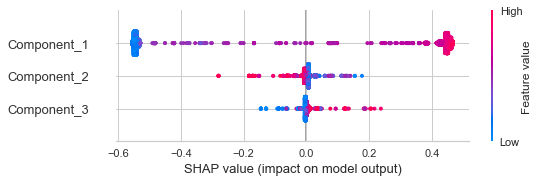

In [99]:
interpret_model(tuned_rf_pca, plot='summary')

In [102]:
#explainer = shap.TreeExplainer(tuned_rf_pca)
#X = df.drop('class', axis=1)
#shap_values = explainer.shap_values(X)
#shap.summary_plot(shap_values, X)

**Visualize a single prediction**

In [107]:
interpret_model(tuned_rf_pca, plot='reason', observation=50)

From the above the plot, we can seethe "base value," which is defined as the mean predicted target; and f(x), which is the prediction for a selected observation (i.e. observation number 32). The red-colored features increased the predicted value, while the blue-colored features decreased it. The size of each feature (i.e. Principal Component) indicates the impact it has on the model.

**Visualize many predictions**

In [ ]:
interpret_model(tuned_rf_pca, plot='reason')